**Importing Libraries and Functions**

In [365]:
from pyMAGEMin.functions import MAGEMin_functions
import juliacall
from juliacall import Main as jl, convert as jlconvert
import underworld3 as uw
import pandas as pd
from scipy import interpolate
import numpy as np
# import pyMAGEMin
import matplotlib.pyplot as plt
import os
# from matplotlib import colors
from scipy.optimize import minimize
# import shapely
from datetime import datetime
import pytz
# from joblib import Parallel, delayed
from tqdm import tqdm
# from contextlib import contextmanager
from tqdm.notebook import tqdm   # notebook-friendly version
import gc
import time

datetime_in_Perth = datetime.now(pytz.timezone('Australia/Perth'))
current_time_str = datetime_in_Perth.strftime('%Y-%m-%d_%H-%M')

outputDir = f'/Users/sdas/Documents/TB_diffusion_modelling/output/Southern India/TB_Files/'
imageDir = f'{outputDir}/Images_{current_time_str}'
fileDir = f'{outputDir}/Files_{current_time_str}'

# Create directories if they don't exist
if uw.mpi.rank == 0:
    os.makedirs(outputDir, exist_ok=True)
    os.makedirs(imageDir, exist_ok=True)
    os.makedirs(fileDir, exist_ok=True)

MAGEMin_C = juliacall.newmodule("MAGEMin_C")
MAGEMin_C.seval("using MAGEMin_C")

In [366]:
# # TB-14-025B
# Xoxides = ['TiO2', 'SiO2', 'Al2O3', 'O', 'K2O', 'Na2O', 'H2O', 'MnO', 'CaO', 'MgO', 'FeO']
# X = [0.60, 65.45, 12.04, 0.40, 3.39, 3.53, 2.90, 0.001, 1.32, 3.69, 6.68]

# TB-14-025B (Modified Bulk Composition)
Xoxides = ['TiO2', 'SiO2', 'Al2O3', 'O', 'K2O', 'Na2O', 'H2O', 'MnO', 'CaO', 'MgO', 'FeO',]
X = [0.60, 65.45, 12.04, 0.40, 3.39, 3.53, 2.90, 0.001, 1.32, 4.40, 7.20,]
# # TB_14_025B = [0.59, 64.65, 11.89, 0.39, 3.34, 3.48, 2.86, 0.001, 1.30, 4.34, 7.11]  # Normalized 

db = "mpe" 
sys_in = 'mol'
rm_solution_phases = ['ep', 'ma', 'sa', 'st', 'chl', 'ctd', 'ilmm']
rm_pure_phase = ['crst', 'trd', 'coe', 'stv', 'sph', 'zo']
rm_phases = jlconvert(jl.Vector[jl.String], rm_solution_phases + rm_pure_phase)
rm_list = MAGEMin_C.remove_phases(rm_phases, db)
X, Xoxides = MAGEMin_C.convertBulk4MAGEMin(jlconvert(jl.Vector[jl.Float64], X),
                                           jlconvert(jl.Vector[jl.String], Xoxides),
                                            sys_in,
                                             db)   
data = MAGEMin_C.Initialize_MAGEMin(db, dataset=636, verbose=0)

**Garnet End-Member value Extraction**

In [367]:
P_values = np.arange(4, 10.01, 0.1) 
T_values = np.arange(400, 1201, 5) 

P_grid, T_grid = np.meshgrid(P_values, T_values)
gt_vol_grid = np.zeros_like(P_grid, dtype=float)
gt_frac_grid = np.zeros_like(P_grid, dtype=float)
gt_alm_grid = np.zeros_like(P_grid, dtype=float)
gt_spss_grid = np.zeros_like(P_grid, dtype=float)
gt_prp_grid = np.zeros_like(P_grid, dtype=float)
gt_gr_grid = np.zeros_like(P_grid, dtype=float)

# ADD BATCH PROCESSING AND MEMORY MANAGEMENT
total_points = len(P_values) * len(T_values)
processed_points = 0
batch_size = 100  # Process 10 points then take a break

print(f"📊 Total calculations: {total_points:,} (reduced from 9,821)")
print(f"📦 Processing in batches of {batch_size}")

with tqdm(total=total_points, desc="Computing Garnet Grid", unit="points") as pbar:
    for i, T in enumerate(T_values):
        for j, P in enumerate(P_values):
            try:
                garnet_calculator = MAGEMin_functions.MAGEMinGarnetCalculator()
                gt_frac, gt_wt, gt_vol, py, alm, spss, gr, kho, out = garnet_calculator.gt_single_point_calc_endmembers(
                    P=float(P), T=float(T), data=data, X=X, Xoxides=Xoxides,
                    sys_in="mol", rm_list=rm_list 
                )
                gt_vol_grid[i, j] = gt_vol
                gt_frac_grid[i, j] = gt_frac
                gt_alm_grid[i, j] = alm
                gt_spss_grid[i, j] = spss
                gt_prp_grid[i, j] = py
                gt_gr_grid[i, j] = gr
                
            except Exception as e:
                gt_vol_grid[i, j] = np.nan
                gt_frac_grid[i, j] = np.nan
                gt_alm_grid[i, j] = np.nan
                gt_spss_grid[i, j] = np.nan
                gt_prp_grid[i, j] = np.nan
                gt_gr_grid[i, j] = np.nan
            
            pbar.update(1)
            processed_points += 1
            
            # MEMORY MANAGEMENT
            if processed_points % batch_size == 0:
                gc.collect()     # Sytem cleaning?  
                time.sleep(0.1)  # Small pause to prevent system overload (0.05 was used previously)

# # SAVE INTERMEDIATE RESULTS (in case of crash)
# if processed_points % 500 == 0:  # Save every 500 points
#     temp_df = pd.DataFrame({
#         'Pressure (kbar)': P_grid.flatten()[:processed_points],
#         'Temperature (C)': T_grid.flatten()[:processed_points], 
#         'Garnet vol.': gt_vol_grid.flatten()[:processed_points],
#         'Garnet frac.': gt_frac_grid.flatten()[:processed_points],
#         'Alm' : gt_alm_grid.flatten()[:processed_points],
#         'Prp' : gt_prp_grid.flatten()[:processed_points],
#         'Spss' : gt_spss_grid.flatten()[:processed_points],
#         'Gr' : gt_gr_grid.flatten()[:processed_points]
#     })
#     temp_df.to_csv('garnet_temp_backup.csv', index=False)

# Final data processing
P_values_flat = P_grid.flatten()
T_values_flat = T_grid.flatten()
gt_vol_flat = gt_vol_grid.flatten()
gt_frac_flat = gt_frac_grid.flatten()
Alm_flat = gt_alm_grid.flatten()
Prp_flat = gt_prp_grid.flatten()
Spss_flat = gt_spss_grid.flatten()
Gr_flat = gt_gr_grid.flatten()

datafile_1 = pd.DataFrame({
    'Pressure (kbar)': P_values_flat,
    'Temperature (C)': T_values_flat,
    'Garnet vol.': gt_vol_flat,
    'Garnet frac.': gt_frac_flat,
    'Almandine' : Alm_flat,
    'Pyrope' : Prp_flat,
    'Spessartine' : Spss_flat,
    'Grossular' : Gr_flat
})

# Save file
datafile_1_name = 'Garnet_PT_rm_list_End_Member_Grid.csv'
datafile_1_save_path = os.path.join(fileDir, datafile_1_name)
datafile_1.to_csv(datafile_1_save_path, index=False)
# print("✅ Calculation completed successfully!")
# print(f"📊 Processed {processed_points:,} points")

📊 Total calculations: 9,821 (reduced from 9,821)
📦 Processing in batches of 100


Computing Garnet Grid:   0%|          | 0/9821 [00:00<?, ?points/s]

 Status             :            0 
 Mass residual      : +4.21936e-15
 Rank               :            0 
 Point              :            1 
 Temperature        :   +400.00000	 [C] 
 Pressure           :     +4.00000	 [kbar]

 SOL = [G: -947.752] (24 iterations, 26.26 ms)
 GAM = [-938.650646,-1717.859735,-779.638781,-663.540877,-328.049399,-871.122773,-804.719476,-987.454806,-241.220225,-510.674558,-355.272497,-355.272497]

 Phase :      fsp       bi      ilm        g      fsp       sp        q       ky 
 Mode  :  0.33337  0.21445  0.00723  0.04476  0.16197  0.00400  0.16917  0.06503 
 Status             :            0 
 Mass residual      : +8.68931e-15
 Rank               :            0 
 Point              :            1 
 Temperature        :   +400.00000	 [C] 
 Pressure           :     +4.10000	 [kbar]

 SOL = [G: -947.522] (25 iterations, 25.69 ms)
 GAM = [-938.422219,-1717.643950,-779.334583,-663.473942,-327.974040,-870.528850,-804.275134,-987.204084,-240.992776,-510.674136,-3

In [368]:
datafile_1

,Pressure (kbar),Temperature (C),Garnet vol.,Garnet frac.,Almandine,Pyrope,Spessartine,Grossular
0,4.0,400,0.035161,0.048750,0.868472,0.065712,0.000461,0.055026
1,4.1,400,0.035213,0.048805,0.866473,0.065129,0.000467,0.057306
2,4.2,400,0.035271,0.048868,0.864577,0.064240,0.000461,0.059780
3,4.3,400,0.035342,0.048949,0.862489,0.063343,0.000472,0.062413
4,4.4,400,0.035422,0.049041,0.860511,0.062189,0.000452,0.065202
...,...,...,...,...,...,...,...,...
9816,9.6,1200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9817,9.7,1200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9818,9.8,1200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9819,9.9,1200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [369]:
gt_alm_grid

array([[0.8684723 , 0.86647318, 0.86457682, ..., 0.72970969, 0.72943082,
        0.72916842],
       [0.8684078 , 0.86673761, 0.86485818, ..., 0.72838486, 0.72813721,
        0.72804762],
       [0.86820398, 0.86665284, 0.86507689, ..., 0.7272467 , 0.72660567,
        0.72658594],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]], shape=(161, 61))

**Garnet Elemental Value Extraction**

In [370]:
P_values = np.arange(4, 10.01, 0.1) 
T_values = np.arange(400, 1201, 5) 

P_grid, T_grid = np.meshgrid(P_values, T_values)
gt_vol_grid = np.zeros_like(P_grid, dtype=float)
gt_frac_grid = np.zeros_like(P_grid, dtype=float)
gt_Fe_grid = np.zeros_like(P_grid, dtype=float)
gt_Mg_grid = np.zeros_like(P_grid, dtype=float)
gt_Mn_grid = np.zeros_like(P_grid, dtype=float)
gt_Ca_grid = np.zeros_like(P_grid, dtype=float)

# ADD BATCH PROCESSING AND MEMORY MANAGEMENT
total_points = len(P_values) * len(T_values)
processed_points = 0
batch_size = 100  # Process 10 points then take a break

print(f"📊 Total calculations: {total_points:,} (reduced from 9,821)")
print(f"📦 Processing in batches of {batch_size}")

with tqdm(total=total_points, desc="Computing Garnet Grid", unit="points") as pbar:
    for i, T in enumerate(T_values):
        for j, P in enumerate(P_values):
            try:
                gt_frac, gt_wt, gt_vol, Mg, Mn, Fe, Ca, out = garnet_calculator.gt_single_point_calc_elements(
                    P=float(P), T=float(T), data=data, X=X, Xoxides=Xoxides,
                    sys_in="mol", rm_list=rm_list 
                )
                gt_vol_grid[i, j] = gt_vol
                gt_frac_grid[i, j] = gt_frac
                gt_Fe_grid[i, j] = Fe
                gt_Mn_grid[i, j] = Mn
                gt_Mg_grid[i, j] = Mg
                gt_Ca_grid[i, j] = Ca
                
            except Exception as e:
                gt_vol_grid[i, j] = np.nan
                gt_frac_grid[i, j] = np.nan
                gt_Fe_grid[i, j] = np.nan
                gt_Mn_grid[i, j] = np.nan
                gt_Mg_grid[i, j] = np.nan
                gt_Ca_grid[i, j] = np.nan
            
            pbar.update(1)
            processed_points += 1
            
            # MEMORY MANAGEMENT
            if processed_points % batch_size == 0:
                gc.collect()     # Sytem cleaning?  
                time.sleep(0.1)  # Small pause to prevent system overload (0.05 was used previously)

# # SAVE INTERMEDIATE RESULTS (in case of crash)
# if processed_points % 500 == 0:  # Save every 500 points
#     temp_df = pd.DataFrame({
#         'Pressure (kbar)': P_grid.flatten()[:processed_points],
#         'Temperature (C)': T_grid.flatten()[:processed_points], 
#         'Garnet vol.': gt_vol_grid.flatten()[:processed_points],
#         'Garnet frac.': gt_frac_grid.flatten()[:processed_points],
#         'Fe' : gt_Fe_grid.flatten()[:processed_points],
#         # 'Prp' : gt_prp_grid.flatten()[:processed_points],
#         # 'Spss' : gt_spss_grid.flatten()[:processed_points],
#         # 'Gr' : gt_gr_grid.flatten()[:processed_points]
#     })
#     temp_df.to_csv('garnet_temp_backup.csv', index=False)

# Final data processing
P_values_flat = P_grid.flatten()
T_values_flat = T_grid.flatten()
gt_vol_flat = gt_vol_grid.flatten()
gt_frac_flat = gt_frac_grid.flatten()
Fe_flat = gt_Fe_grid.flatten()
Mg_flat = gt_Mg_grid.flatten()
Mn_flat = gt_Mn_grid.flatten()
Ca_flat = gt_Ca_grid.flatten()

datafile_2 = pd.DataFrame({
    'Pressure (kbar)': P_values_flat,
    'Temperature (C)': T_values_flat,
    'Garnet vol.': gt_vol_flat,
    'Garnet frac.': gt_frac_flat,
    'Fe' : Fe_flat,
    'Mg' : Mg_flat,
    'Mn' : Mn_flat,
    'Ca' : Ca_flat
})

# Save file
datafile_2_name = 'Garnet_PT_rm_list_Elemental_Grid.csv'
datafile_2_save_path = os.path.join(fileDir, datafile_2_name)
datafile_2.to_csv(datafile_2_save_path, index=False)
# print("✅ Calculation completed successfully!")
# print(f"📊 Processed {processed_points:,} points")

📊 Total calculations: 9,821 (reduced from 9,821)
📦 Processing in batches of 100


Computing Garnet Grid:   0%|          | 0/9821 [00:00<?, ?points/s]

 Status             :            0 
 Mass residual      : +4.21936e-15
 Rank               :            0 
 Point              :            1 
 Temperature        :   +400.00000	 [C] 
 Pressure           :     +4.00000	 [kbar]

 SOL = [G: -947.752] (24 iterations, 25.25 ms)
 GAM = [-938.650646,-1717.859735,-779.638781,-663.540877,-328.049399,-871.122773,-804.719476,-987.454806,-241.220225,-510.674558,-355.272497,-355.272497]

 Phase :      fsp       bi      ilm        g      fsp       sp        q       ky 
 Mode  :  0.33337  0.21445  0.00723  0.04476  0.16197  0.00400  0.16917  0.06503 
 Status             :            0 
 Mass residual      : +8.68931e-15
 Rank               :            0 
 Point              :            1 
 Temperature        :   +400.00000	 [C] 
 Pressure           :     +4.10000	 [kbar]

 SOL = [G: -947.522] (25 iterations, 25.78 ms)
 GAM = [-938.422219,-1717.643950,-779.334583,-663.473942,-327.974040,-870.528850,-804.275134,-987.204084,-240.992776,-510.674136,-3

In [371]:
datafile_2

,Pressure (kbar),Temperature (C),Garnet vol.,Garnet frac.,Fe,Mg,Mn,Ca
0,4.0,400,0.035161,0.048750,0.868472,0.076040,0.000461,0.055026
1,4.1,400,0.035213,0.048805,0.866473,0.075753,0.000467,0.057306
2,4.2,400,0.035271,0.048868,0.864577,0.075182,0.000461,0.059780
3,4.3,400,0.035342,0.048949,0.862489,0.074627,0.000472,0.062413
4,4.4,400,0.035422,0.049041,0.860511,0.073834,0.000452,0.065202
...,...,...,...,...,...,...,...,...
9816,9.6,1200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9817,9.7,1200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9818,9.8,1200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9819,9.9,1200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [372]:
gt_Fe_grid

array([[0.8684723 , 0.86647318, 0.86457682, ..., 0.72970969, 0.72943082,
        0.72916842],
       [0.8684078 , 0.86673761, 0.86485818, ..., 0.72838486, 0.72813721,
        0.72804762],
       [0.86820398, 0.86665284, 0.86507689, ..., 0.7272467 , 0.72660567,
        0.72658594],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]], shape=(161, 61))

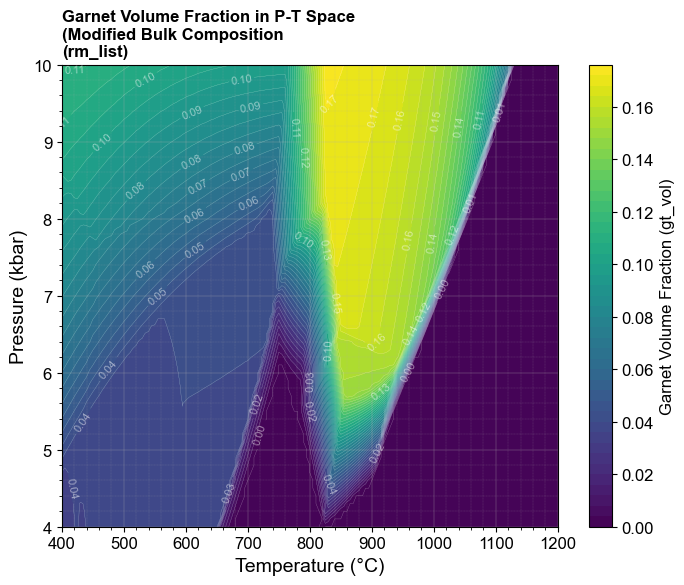

In [374]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12
plt.figure(figsize=(8, 6))

# Filled contour (smooth color map)
levels = 50  # more levels = smoother appearance
c = plt.contourf(T_grid, P_grid, gt_vol_grid, levels=levels, cmap="viridis")

# Overlay thin contour lines
lines = plt.contour(T_grid, P_grid, gt_vol_grid, levels=levels, 
                    colors='white', linewidths=0.2, alpha=0.5)

# Optional: add contour labels
plt.clabel(lines, inline=True, fontsize=8, fmt="%.2f", colors="white")
plt.colorbar(c, label="Garnet Volume Fraction (gt_vol)")

# Labels and title
plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("Pressure (kbar)", fontsize=14)
plt.title("Garnet Volume Fraction in P-T Space\n(Modified Bulk Composition\n(rm_list)", fontsize=12, fontweight="bold", loc='left')

# plt.grid(False)  # turn off background grid since contours already show structure
plt.minorticks_on()
plt.grid(which="major", linestyle="-", linewidth=0.2, alpha=1.)   # faint major grid
plt.grid(which="minor", linestyle=":", linewidth=0.2, alpha=1.0 )
plt.savefig(f'{imageDir}/GVol_ModBulk_rm_list_TB-14-025B.png', dpi=600, bbox_inches='tight')
plt.show()

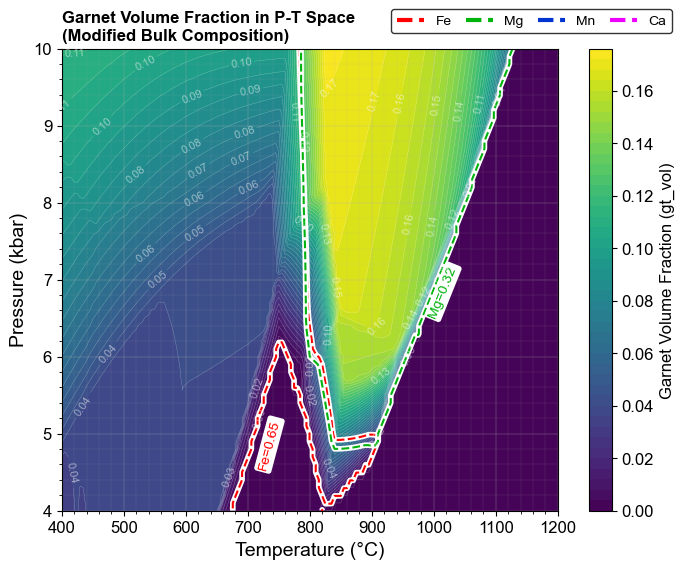

In [397]:
import matplotlib.lines as mlines

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12
plt.figure(figsize=(8, 6))

alm_level = 0.6547
prp_level = 0.31669
# spss_level = 0.01181
# gr_level = 0.01736

# Filled contour (smooth color map)
levels = 50  # more levels = smoother appearance
c = plt.contourf(T_grid, P_grid, gt_vol_grid, levels=levels, cmap="viridis")
# Overlay thin contour lines
lines = plt.contour(T_grid, P_grid, gt_vol_grid, levels=levels, 
                    colors='white', linewidths=0.2, alpha=0.5)
plt.clabel(lines, inline=True, fontsize=8, fmt="%.2f", colors="white")
plt.colorbar(c, label="Garnet Volume Fraction (gt_vol)")

cs_alm_bg = plt.contour(T_grid, P_grid, gt_Fe_grid, levels=[alm_level], colors="#ffffff", linewidths=4) 
cs_alm_fg = plt.contour(T_grid, P_grid, gt_Fe_grid, levels=[alm_level],
                        colors='#ff0000', linewidths=1.5, linestyles='--') 
plt.text(
    x=735, 
    y=5.2, 
    s=f"Fe={alm_level:.2f}",
    fontsize=10,
    color='#ff0000',
    ha='center',
    va='top',
    rotation=75, 
    bbox=dict(
        boxstyle="round,pad=0.2", 
        facecolor='white',         
        edgecolor='none'     
    )
)

cs_prp_bg = plt.contour(T_grid, P_grid, gt_Mg_grid, levels=[prp_level], colors="#ffffff", linewidths=4) 
cs_prp_fg = plt.contour(T_grid, P_grid, gt_Mg_grid, levels=[prp_level],
                         colors='#00b30c', linewidths=1.5, linestyles='--') 
plt.text(
    x=1015, 
    y=7.2, 
    s=f"Mg={prp_level:.2f}",
    fontsize=10,
    color='#00b30c',
    ha='center',
    va='top',
    rotation=68,  
    bbox=dict(
        boxstyle="round,pad=0.2",  
        facecolor='white',         
        edgecolor='none'           
    )
)

# cs_spss_fg = plt.contour(T_grid, P_grid, gt_spss_grid, levels=[spss_level],
#                          colors='#0034d1', linewidths=3, linestyles='--') 
# plt.clabel(cs_spss_fg, fontsize=12, colors='#0034d1',) # fmt=f"Spss={spss_level:.2f}",

# cs_gr_fg =plt.contour(T_grid, P_grid, gt_spss_grid, levels=[spss_level],
#                          colors='#ee00ff', linewidths=3, linestyles='--') 
# plt.clabel(cs_spss_fg, fontsize=12, colors='#ee00ff',)  #fmt=f"Spss={spss_level:.2f}",


# Legend
alm_line = mlines.Line2D([], [], color='#ff0000', linestyle='--', linewidth=3, label=f"Fe")
prp_line = mlines.Line2D([], [], color='#00b30c', linestyle='--', linewidth=3, label=f"Mg")
spss_line = mlines.Line2D([], [], color='#0034d1', linestyle='--', linewidth=3, label=f"Mn")
gr_line = mlines.Line2D([], [], color='#ee00ff', linestyle='--', linewidth=3, label=f"Ca")

plt.legend(
    # title = "Legend",
    # title_fontweight ="bold",
    handles=[alm_line, prp_line, spss_line, gr_line],
    loc='upper left',           # Position the legend's top-left anchor
    bbox_to_anchor=(0.65, 1.1),   # Move the legend box outside the plot area
    fontsize=10,
    frameon=True,
    edgecolor='black',           # Add a black border
    ncol=4,
    labelspacing=0.5,
    columnspacing=1.0
)

# Labels and title
plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("Pressure (kbar)", fontsize=14)
plt.title(
    "Garnet Volume Fraction in P-T Space\n(Modified Bulk Composition)",
    fontsize=12,
    fontweight="bold",
    loc='left'
    )

# plt.grid(True)  # turn off background grid since contours already show structure
plt.minorticks_on()
plt.grid(which="major", linestyle="-", linewidth=0.2, alpha=1.)   # faint major grid
plt.grid(which="minor", linestyle=":", linewidth=0.2, alpha=1.0 )   # even fainter minor grid
plt.savefig(f'{imageDir}/GVol_ModBulk_rm_list_Elemental_Core_3_TB-14-025B.png', dpi=600, bbox_inches='tight')
plt.show()

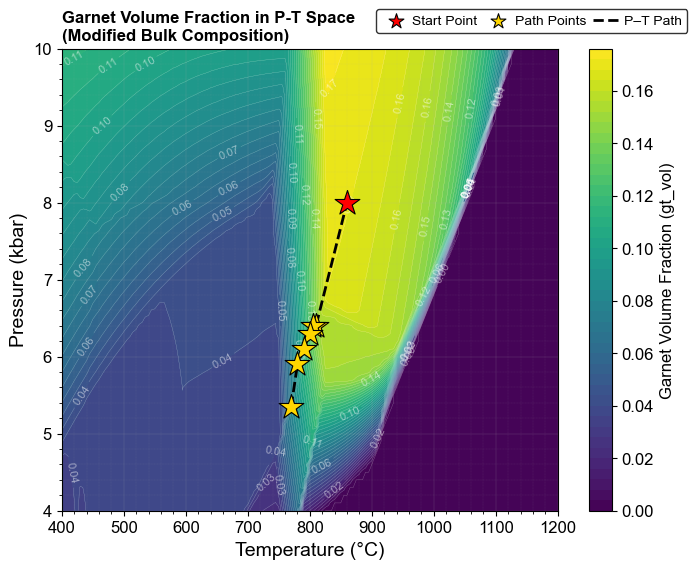

In [322]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 12
plt.figure(figsize=(8, 6))

P_points = np.array([8, 6.4, 6.4, 6.3, 6.1, 5.9, 5.35])
T_points = np.array([860, 810, 805, 800, 790, 780, 770])
T_smooth = np.linspace(T_points.min(), T_points.max(), 300)
P_smooth = np.interp(T_smooth, T_points[::-1], P_points[::-1])

# Garnet volume fraction
levels = 50
c = plt.contourf(T_grid, P_grid, gt_vol_grid, levels=levels, cmap="viridis")
lines = plt.contour(T_grid, P_grid, gt_vol_grid, levels=levels,
                    colors='white', linewidths=0.2, alpha=0.5)
plt.clabel(lines, inline=True, fontsize=8, fmt="%.2f", colors="white")
plt.colorbar(c, label="Garnet Volume Fraction (gt_vol)")

# Marker and coloring for PT points
plt.scatter(T_points[0], P_points[0],
            marker="*", s=350, color="red", edgecolor="black", linewidth=0.8,
            zorder=4, label="Start Point")
plt.scatter(T_points[1:], P_points[1:],
            marker="*", s=350, color="#FFD700", edgecolor="black", linewidth=0.8,
            zorder=4, label="Path Points")
plt.plot(T_smooth, P_smooth,
         color="black", linestyle="--", linewidth=2, zorder=3,
         label="P–T Path")

# Legend
plt.legend(
    loc="upper left",              # anchor relative to bbox_to_anchor
    bbox_to_anchor=(0.62, 1.1),    # push legend outside to the right
    fontsize=10,
    frameon=True,
    edgecolor="black",
    ncol=3,
    scatterpoints = 1,
    markerscale = 0.6,
    handletextpad = 0.2,
    columnspacing = 0.5
)

# Labels and title
plt.xlabel("Temperature (°C)", fontsize=14)
plt.ylabel("Pressure (kbar)", fontsize=14)
plt.title(
    "Garnet Volume Fraction in P-T Space\n(Modified Bulk Composition)",
    fontsize=12,
    fontweight="bold",
    loc='left'
    )

plt.minorticks_on()
plt.grid(which="major", linestyle="-", linewidth=0.2, alpha=0.5)
plt.grid(which="minor", linestyle=":", linewidth=0.2, alpha=0.5)
plt.savefig(f'{imageDir}/GVol_ModBulk_PTpath__TB-14-025B.png', dpi=600, bbox_inches='tight')
plt.show()


In [326]:
# import numpy as np
# import matplotlib.pyplot as plt
# import pandas as pd

# plt.rcParams['font.family'] = 'Arial'
# plt.rcParams['font.size'] = 12
# plt.figure(figsize=(8, 6))

# # Original PT points
# P_points = np.array([8, 6.4, 6.4, 6.3, 6.1, 5.9, 5.35])
# T_points = np.array([860, 810, 805, 800, 790, 780, 770])

# # Smooth original path
# T_smooth = np.linspace(T_points.min(), T_points.max(), 300)
# P_smooth = np.interp(T_smooth, T_points[::-1], P_points[::-1])

# # --- Offset paths (keep first point fixed) ---
# # +5% offset (excluding first point)
# T_plus = T_points.copy()
# P_plus = P_points.copy()
# T_plus[1:] = T_points[1:] * 1.05
# P_plus[1:] = P_points[1:] * 1.05
# T_plus_smooth = np.linspace(T_plus.min(), T_plus.max(), 300)
# P_plus_smooth = np.interp(T_plus_smooth, T_plus[::-1], P_plus[::-1])

# # -5% offset (excluding first point)
# T_minus = T_points.copy()
# P_minus = P_points.copy()
# T_minus[1:] = T_points[1:] * 0.95
# P_minus[1:] = P_points[1:] * 0.95
# T_minus_smooth = np.linspace(T_minus.min(), T_minus.max(), 300)
# P_minus_smooth = np.interp(T_minus_smooth, T_minus[::-1], P_minus[::-1])

# # --- Save all points to CSV ---
# df = pd.DataFrame({
#     "T_original": T_points,
#     "P_original": P_points,
#     "T_plus5pct": T_plus,
#     "P_plus5pct": P_plus,
#     "T_minus5pct": T_minus,
#     "P_minus5pct": P_minus
# })
# # df.to_csv("PT_path_offsets_fixed_start.csv", index=False)

# # --- Plotting ---
# levels = 50
# c = plt.contourf(T_grid, P_grid, gt_vol_grid, levels=levels, cmap="viridis")
# lines = plt.contour(T_grid, P_grid, gt_vol_grid, levels=levels,
#                     colors='white', linewidths=0.2, alpha=0.5)
# plt.clabel(lines, inline=True, fontsize=8, fmt="%.2f", colors="white")
# plt.colorbar(c, label="Garnet Volume Fraction (gt_vol)")

# # Original PT points
# plt.scatter(T_points[0], P_points[0], marker="*", s=350, color="red", edgecolor="black", linewidth=0.8, zorder=4, label="Start Point")
# plt.scatter(T_points[1:], P_points[1:], marker="*", s=350, color="#FFD700", edgecolor="black", linewidth=0.8, zorder=4, label="Path Points")
# plt.plot(T_smooth, P_smooth, color="black", linestyle="--", linewidth=2, zorder=3, label="P–T Path")

# # Offset lines
# plt.plot(T_plus_smooth, P_plus_smooth, color="orange", linestyle="-", linewidth=2, zorder=3, label="P–T +5%")
# plt.plot(T_minus_smooth, P_minus_smooth, color="magenta", linestyle="-", linewidth=2, zorder=3, label="P–T -5%")

# # Legend
# plt.legend(loc="upper left", bbox_to_anchor=(0.62, 1.1), fontsize=10, frameon=True, edgecolor="black", ncol=3, scatterpoints=1, markerscale=0.6, handletextpad=0.2, columnspacing=0.5)

# # Labels and title
# plt.xlabel("Temperature (°C)", fontsize=14)
# plt.ylabel("Pressure (kbar)", fontsize=14)
# plt.title("Garnet Volume Fraction in P-T Space\n(Modified Bulk Composition)", fontsize=12, fontweight="bold", loc='left')

# plt.minorticks_on()
# plt.grid(which="major", linestyle="-", linewidth=0.2, alpha=0.5)
# plt.grid(which="minor", linestyle=":", linewidth=0.2, alpha=0.5)

# # plt.savefig(f'{imageDir}/GVol_ModBulk_PTpath_offsets_fixed_start_TB-14-025B.png', dpi=600, bbox_inches='tight')
# plt.show()
